<a href="https://colab.research.google.com/github/fcastellanosp/MINE-4206_202410_AML/blob/main/Talleres/Taller%201/Taller%201.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

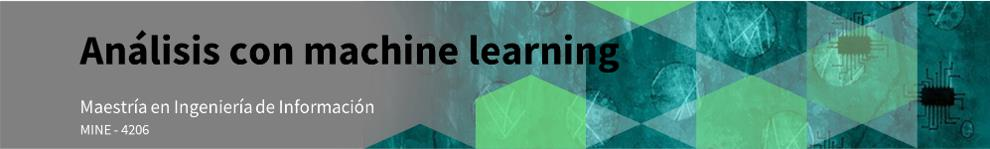

- **Integrante 1:** Jairo Chaparro 201531080
- **Integrante 2:**

---
# Contexto y objetivos.

En el sector hotelero, la cancelación de reservas es un problema significativo que puede tener un impacto negativo en la rentabilidad y la gestión de recursos de un hotel. Las cancelaciones pueden deberse a una variedad de razones, como cambios en los planes de viaje, emergencias personales o simplemente una mejor oferta encontrada en otro lugar. Para los hoteles, esto puede resultar en habitaciones vacías que podrían haber sido vendidas a otros clientes, lo que lleva a una pérdida de ingresos y a una subutilización de recursos como personal, limpieza y mantenimiento.

Además, la cancelación de reservas puede afectar la capacidad del hotel para planificar y gestionar adecuadamente su inventario de habitaciones. Por ejemplo, si un hotel espera que una cierta cantidad de habitaciones estén ocupadas en una fecha determinada y luego se cancelan muchas reservas, el hotel puede encontrarse con un exceso de disponibilidad de habitaciones que podría haberse asignado de manera más eficiente.

El objetivo principal es desarrollar un modelo predictivo capaz de determinar si una reserva será cancelada o no. Esto permitirá al hotel tomar medidas proactivas, como ofrecer incentivos a los clientes para que no cancelen sus reservas, o gestionar de manera más eficiente la disponibilidad de habitaciones.

Por lo tanto, para poder tomar decisiones en este estudio, se debe presentar:



**Objetivos de desarrollo**:
* Aplicar técnicas de clasificación para construir diferentes modelos predictivos que permitan estimar las cancelaciones del hotel siguiendo el ciclo de machine learning.
* Determinar cuáles son los factores que más inciden en la demanda con base en los datos.

**Datos**: Información obtenida de [hotel-booking-cancellation-prediction](https://www.kaggle.com/datasets/youssefaboelwafa/hotel-booking-cancellation-prediction).

# Entendimiento del negocio.

El conjunto de datos recoge información acerca de reservas de hoteles. Tanto la cantidad de personas en la reserva, número de noches, tipo de habitación, precio promedio, etc... Es importante que revises el diccionario como primer paso para comprender estos datos.


Con apoyo de la organización ha sido posible elaborar el siguiente diccionario de datos:

| ATRIBUTO | DEFINICIÓN |
| :- | :- |
| **Booking_ID** | Identificador único para cada reservación. |
| **number of adults** | Cantidad de adultos incluídos en la reservación. |
| **number if children** | Cantidad de niños incluídos en la reservación. |
| **number of weekend nights** | Número de noches de fin de semana incluídas en la reserva. |
| **number of week nights** | Número de noches entre semana incluídas en la reserva. |
| **type of meal** | Tipo de comida incluída en la reserva. |
| **car parking space** | Indica si se pidió o si se incluía un espacio de parqueadero. |
| **room type** | Tipo de habitación en la reserva. |
| **lead time** | Número de días entre el dia que se realizó la resrerva y el día de reserva. |
| **market segment type** | Tipo de mercado asociado en la reserva. |
| **repeated** | Indica si la reserva es una reserva repetida. |
| **P-C** | Número de reservas canceladas por el usuario antes de la reserva actual. |
| **P-not-C** | Número de reservas cumplidas por el usuario antes de la reserva actual. |
| **average price** | Precio promedio asociado a la reserva. |
| **special request** | Cantidad de peticiones especiales hechas por el usuario. |
| **date of reservation** | Fecha de la reserva. |
| **booking status** | Estado de la reserva (cancelada o no cancelada). |







# Actividades a realizar.

1. Explorar y perfilar los datos utilizando las funciones de la libreria pandas. Recuerda que este paso es muy importante para determinar problemas de calidad (*por ejemplo, valores ausentes y registros duplicados*). Documentar hallazgos (insights) importantes para el negocio.

2. Limpiar y preparar los datos. Justifica las decisiones tomadas basada en la exploración de datos del punto anterior.

3. Realiza el modelamiento de datos en pipelines los algoritmos: Regresión Logística, Support Vector Machine (SVM), Random Forest y Adaboosting. Para cada uno de ellos realiza la busqueda de hiperparámetros y justifica la métrica que vas a usar para el ranking de los modelos.

4. Implementa gráficas que permitan ayudar a interpretar cada una de las clases en cada uno de los modelos.

5. Genera una tabla comparativa e interpreta las métricas de los algoritmos del punto anterior. Al comparar los resultados de los diferentes algoritmos, ¿cuál es el mejor modelo segun el objetivo del negocio y por qué?

**NOTA**: La calificación será sobre notebook ejecutado y cargado en Bloque Neón junto con el archivo HTML.

#Instalación de librerías

In [1]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     - 17.8 MB 33.1 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 1.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 26.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 22.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 39.9 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=357915 sha256=a3e508f840cf9190e41d3b9416a41bbd1a6b8022688472f2e3789eecd6b6a958
  Stored in directory: /tmp/pip-ephem-wheel-cache-v7oa7qeo/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=53c05d39b9639f3d9b5783ede382b2fa62af54f156177be0d42eb06c2143f2f3
  Stored in directory

In [2]:
!pip install kaggle

#Importación de librerías

In [80]:
# Manejo de datos
import pandas as pd
import numpy as np

#Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#Analisis profundo de datos
from ydata_profiling import ProfileReport

#scikit-learn
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, FunctionTransformer
from sklearn.linear_model import Lasso, Ridge
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.metrics import classification_report, confusion_matrix, RocCurveDisplay, PrecisionRecallDisplay, roc_curve, roc_auc_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, SelectPercentile
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import plot_tree
from sklearn.svm import SVC

from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

#Librerías extras
import itertools

from datetime import datetime

print(f"La versión de sklearn es: {sklearn.__version__}")

La versión de sklearn es: 1.2.2


#Importación de datos

In [4]:
#Preparar el archivo de kaggle para la descarga
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [5]:
#Verificamos la conectividad con kaggle, usando un comando para ver una previsualización de datasets
!kaggle datasets list

ref                                                           title                                               size  lastUpdated          downloadCount  voteCount  usabilityRating  
------------------------------------------------------------  -------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
syedanwarafridi/vehicle-sales-data                            Vehicle Sales Data                                  19MB  2024-02-21 20:16:17          14576        265  1.0              
sudarshan24byte/online-food-dataset                           Online Food Dataset                                  3KB  2024-03-02 18:50:30           4445         75  0.9411765        
arnavvvvv/spotify-music                                       Top Spotify Songs                                   47KB  2024-03-06 05:20:29           4068         59  1.0              
tarunrm09/climate-change-indicators                           Climate chang

In [6]:
#Una vez hemos asegurado la conectividad, procedemos a realizar el proceso de descarga de la información del negocio.
!kaggle datasets download -d youssefaboelwafa/hotel-booking-cancellation-prediction

  0% 0.00/470k [00:00<?, ?B/s]
100% 470k/470k [00:00<00:00, 102MB/s]


In [7]:
ROOT_DIR = '/content'
DATASET_NAME = 'hotel-booking-cancellation-prediction'
DATASET_FILE = "booking.csv"

In [8]:
#consolidar el bloque de comandos con todos los pasos para la descompresión del archivo zip
%cd {ROOT_DIR}
!mkdir /{DATASET_NAME}
!unzip {DATASET_NAME}.zip -d {ROOT_DIR}/{DATASET_NAME}

/content
Archive:  hotel-booking-cancellation-prediction.zip
  inflating: /content/hotel-booking-cancellation-prediction/booking.csv  


In [9]:
#Generamos la ruta del archivo csv para carga al Pandas Dataframe
DATA_DIR = f"{ROOT_DIR}/{DATASET_NAME}/{DATASET_FILE}"


In [10]:
#Convertimos el archivo descargado a un data set
data_df = pd.read_csv(DATA_DIR)

In [11]:
#Previsualizamos la información
data_df.head(10)

,Booking_ID,number of adults,number of children,number of weekend nights,number of week nights,type of meal,car parking space,room type,lead time,market segment type,repeated,P-C,P-not-C,average price,special requests,date of reservation,booking status
0,INN00001,1,1,2,5,Meal Plan 1,0,Room_Type 1,224,Offline,0,0,0,88.00,0,10/2/2015,Not_Canceled
1,INN00002,1,0,1,3,Not Selected,0,Room_Type 1,5,Online,0,0,0,106.68,1,11/6/2018,Not_Canceled
2,INN00003,2,1,1,3,Meal Plan 1,0,Room_Type 1,1,Online,0,0,0,50.00,0,2/28/2018,Canceled
3,INN00004,1,0,0,2,Meal Plan 1,0,Room_Type 1,211,Online,0,0,0,100.00,1,5/20/2017,Canceled
4,INN00005,1,0,1,2,Not Selected,0,Room_Type 1,48,Online,0,0,0,77.00,0,4/11/2018,Canceled
5,INN00006,1,0,0,2,Meal Plan 2,0,Room_Type 1,346,Offline,0,0,0,100.00,1,9/13/2016,Canceled
6,INN00007,1,1,1,4,Meal Plan 1,0,Room_Type 1,34,Online,0,0,0,107.55,1,10/15/2017,Not_Canceled
7,INN00008,3,0,1,3,Meal Plan 1,0,Room_Type 4,83,Online,0,0,0,105.61,1,12/26/2018,Not_Canceled
8,INN00009,1,1,0,4,Meal Plan 1,0,Room_Type 1,121,Offline,0,0,0,96.90,1,7/6/2018,Not_Canceled
9,INN00010,2,0,0,5,Meal Plan 1,0,Room_Type 4,44,Online,0,0,0,133.44,3,10/18/2018,Not_Canceled


In [12]:
print(f"El número de datos es de: {data_df.shape[0]:,}, el número de características es de: {data_df.shape[1]}")

El número de datos es de: 36,285, el número de características es de: 17


#Separación test y entrenamiento

In [13]:
#Separamos el conjunto de datos en test y entrenamiento
train, test = train_test_split(data_df, test_size=0.2, random_state=17)

In [14]:
#del conjunto de datos de entrenamiento obtenemos el conjunto de validación y entrenamiento final
train_final,validacion=train_test_split(train,test_size=0.2,random_state=17)

In [15]:
train_count = train_final.shape[0]
val_count = validacion.shape[0]
test_count = test.shape[0]

print("-------------------SEPARACIÓN DE LA INFORMACIÓN-------------------")
print(f"-> Train: {train_count:,}")
print(f"-> Validation: {val_count:,}")
print(f"-> Test: {test_count:,}")

-------------------SEPARACIÓN DE LA INFORMACIÓN-------------------
-> Train: 23,222
-> Validation: 5,806
-> Test: 7,257


#Exploración de datos

In [16]:
ProfileReport(train_final)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
#Generamos el pandas profiling en un archivo .html para poder trabajar mejor con él
ProfileReport(train_final).to_file("reservas.html")

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:354: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
train_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23222 entries, 28582 to 13967
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Booking_ID                23222 non-null  object 
 1   number of adults          23222 non-null  int64  
 2   number of children        23222 non-null  int64  
 3   number of weekend nights  23222 non-null  int64  
 4   number of week nights     23222 non-null  int64  
 5   type of meal              23222 non-null  object 
 6   car parking space         23222 non-null  int64  
 7   room type                 23222 non-null  object 
 8   lead time                 23222 non-null  int64  
 9   market segment type       23222 non-null  object 
 10  repeated                  23222 non-null  int64  
 11  P-C                       23222 non-null  int64  
 12  P-not-C                   23222 non-null  int64  
 13  average price             23222 non-null  float64
 14  sp

#Insights

Los datos tienen un total de 17 caracteristicas, con un toatl de 23222 instancias.No se cuenta con valores nulos ni tampoco filas duplicadas. Las variables se ditribuyen de la siguiente forma: 2 de texto, 7 categoricas y 8 numericas.

A continuación se encuentra el tratamiento sugerido para cada una de las caracteristicas:

|ATRIBUTO | PROPUESTA |
|---| :- |
| **Booking_ID** | Al ser un identificador contiene una alta cardinalidad por lo que se recomienda eliminar esta característica|
| **number of adults** |Tiene un total de 5 valores diferentes. Tiene un desbalance significativo dentro de sus caracteristicas. A esta variable le haremos el siguiente tratamiento: Los ceros se convierten en valores nulos ya que no tiene sentido dar una reserva donde no hay adultos. Los de un adulto se categoriza como "solteros", los de 2 adultos como "parejas" y agrupamos más de dos como "grupos_grandes".|
| **number of children** |Tiene un total de 6 valores diferentes. Contiene una gran cantidad de ceros, pero no se recomienda eliminarla. La volveremos una variable categórica donde se conviertan los ceros por "no_hay_menores" y más de cero por "si_hay_menores"|
| **number of weekend nights** |Tiene un total de 8 valores diferentes. Contiene una gran cantidad de ceros pero no se recomienda eliminarla. El tratamiento que le vamos a dar es "Ninguna" para los valores de cero, "una_noche" para los valores de 1, "dos_noches" para los valores de dos y "mas_de_dos" para los valores superiores a dos noches.|
| **number of week nights** |Tiene un total de 18 valores diferentes. No contiene una gran cantidad de ceros. El tratamiento que le vamos a dar es "Ninguna" para los valores de cero, "una_noche" para los valores de 1, "dos_noches" para los valores de dos y "mas_de_dos" para los valores superiores a dos noches.|
| **type of meal** |Es una variable categorica con 4 categorías diferentes. Presenta un desbalance significativo. Para esta variable vamos a converitr a valor nulo el "meal Plan 3" ya que menos del 0.1% de las instancias tienen este plan. |
| **car parking space** |Es una variable binaria. Presenta un desbalance significativo.|
| **room type** |Es una variable categorica con 7 categorías diferentes. Presenta un desbalance significativo. Para esta variable convertiremos a valores nulos la categoría "room_type_3" ya que menos del 0.1% de las instancias tienen esta categoría. |
| **lead time** |Variable numérica no categórica con un bajo porcentaje de ceros.|
| **market segment type** |Variable categórica con 5 categorías.|
| **repeated** |Variable binaria|
| **P-C** |Variable numerica que se puede convertir en categorica. Los ceros se pueden convertir por una categoría llamada "no_ha _cancelado" y los de más de cero por una categoria "si_ha_cancelado"|
| **P-not-C** |Variable numerica que se puede convertir en categorica. Cuando sea cero se puede crear una categoría "no_ha_cumplido" y cuando sea diferente de cero se puede asignar una categoría que sea "sí_ha_cumplido"|
| **average price** |Variable numérica, con bajo porcentaje de ceros. Sin embargo, convertimos a valores nulos los ceros ya que para el contexto del negocio una reserva de precio cero no tiene sentido.|
| **special request** |Variable categórica con 6 valores diferentes, para esta variable se asignará un valor categórico de "No_hizo_peticion" cuando su valor sea cero y otro valor de "Hizo_peticion" cuando sea mayor a cero. |
| **date of reservation** |Variable tipo texto, se recomienda transformarla a tipo fecha y luego convertirla para que solo quede en un valor numérico la cantidad de días desde que se hizo la reserva desde la fecha actual|
| **booking status** |Variable objetivo, hay que volverla binaria|

Después de realizar una primera aproximación a los datos, algo que se puede observar a primera vista es el nivel de desbalanceo que hay en nuestras variables. De aquí podemos inferir que tendremos que aplicar ciertas técnicas para que nuestros algoritmos (Especialmente en el caso de la regresión logística y la máquina de vectores) no se vean afectados por este fenómeno.

En este caso en vez de eliminar filas y perder información, lo que se hará es convertir a valores nulos, aquellos valores que sean atípicos para el negocio, para luego poder hacerles una imputación.

#Limpieza de datos

Las funciones de esta sección, aplicarán las estrategias mencionadas en los insights.

In [19]:
copy_train_final=train_final.copy()

In [20]:
#Esta función elimina la columna Booking ID
def eliminar_variables(df):
  Variables_Eliminar=['Booking_ID']
  df=df.drop(Variables_Eliminar,axis=1)
  return df

In [21]:
#Aplicamos la función
copy_train_final=eliminar_variables(copy_train_final)

In [22]:
#Esta función nos permite modificar la columna "number of adults"
def modificar_adultos(df):
    # Primero, reemplazamos por NaN los valores donde la columna sea cero
    df.loc[df['number of adults'] == 0,'number of adults']=None

    #Creamos una funcion que transforme los valores
    def transformar_valor(valor):
        if pd.isna(valor):  # Chequeamos si el valor es NaN
            return valor  # Devolvemos NaN directamente sin transformarlo
        elif valor == 1:
            return "Soltero"
        elif valor == 2:
            return "Parejas"
        else:
            return "Grupos grandes"
    # Luego, usamos .apply() para transformar los valores en la columna 'number of adults'
    df['number of adults'] = df['number of adults'].apply(transformar_valor)
    return df

In [23]:
#Aplicamos la funcion modificar_adultos
copy_train_final=modificar_adultos(copy_train_final)
#Comprobamos el resultado
copy_train_final["number of adults"].unique()

array(['Parejas', 'Soltero', 'Grupos grandes', nan], dtype=object)

In [24]:
#Esta función nos permite modificar la columna "number of adults"
def modificar_ninos(df):

    # Creamos una funcion que transforme los valores
    def transformar_valor(valor):
        if valor == 0:
            return "No_hay_niños"
        elif valor > 0:
            return "Hay_niños"
    # Luego, usamos .apply() para transformar los valores en la columna 'number of children'
    df['number of children'] = df['number of children'].apply(transformar_valor)
    return df

In [25]:
#Aplicamos la funcion modificar_ninos
copy_train_final=modificar_ninos(copy_train_final)
#comprobamos el resultado
copy_train_final["number of children"].unique()

array(['Hay_niños', 'No_hay_niños'], dtype=object)

In [26]:
#Esta función nos permite modificar la columna "number of weekend nights"
def modificar_fines_semana(df):

    # Creamos una funcion que transforme los valores
    def transformar_valor(valor):
        if valor == 0:
          return "Ninguna"
        elif valor == 1:
          return "Una_noche"
        elif valor == 2:
          return "Dos_noches"
        elif valor > 2:
          return "Más_de_dos_noches"
    # Luego, usamos .apply() para transformar los valores en la columna 'number of weekend nights'
    df['number of weekend nights'] = df['number of weekend nights'].apply(transformar_valor)
    return df

In [27]:
#Aplicamos la funcion modificar_fines_semana
copy_train_final=modificar_fines_semana(copy_train_final)
#comprobamos el resultado
copy_train_final["number of weekend nights"].unique()

array(['Una_noche', 'Dos_noches', 'Ninguna', 'Más_de_dos_noches'],
      dtype=object)

In [28]:
#Esta función nos permite modificar la columna "number of week nights"
def modificar_semana(df):

    # Creamos una funcion que transforme los valores
    def transformar_valor(valor):
        if valor == 0:
          return "Ninguna"
        elif valor == 1:
          return "Una_noche"
        elif valor == 2:
          return "Dos_noches"
        elif valor > 2:
          return "Más_de_dos_noches"
    # Luego, usamos .apply() para transformar los valores en la columna 'number of week nights'
    df['number of week nights'] = df['number of week nights'].apply(transformar_valor)
    return df

In [29]:
#Aplicamos la funcion modificar_fines_semana
copy_train_final=modificar_semana(copy_train_final)
#comprobamos el resultado
copy_train_final["number of week nights"].unique()

array(['Una_noche', 'Dos_noches', 'Más_de_dos_noches', 'Ninguna'],
      dtype=object)

In [30]:
def modificar_meal(df):

    # Identificar los índices de las filas donde 'type of meal' es el plan 3
    df.loc[df['type of meal'] == "Meal Plan 3",'type of meal']=None

    return df

In [31]:
#Aplicamos la funcion modificar_meal
copy_train_final=modificar_meal(copy_train_final)
#comprobamos el resultado
copy_train_final["type of meal"].unique()

array(['Meal Plan 1', 'Not Selected', 'Meal Plan 2', None], dtype=object)

In [32]:
def modificar_room_type(df):

    # Identificar las filas donde 'room type' es "Room_Type 3" y reemplazar con NaN
    df.loc[df['room type'] == "Room_Type 3", 'room type'] = None
    return df

In [33]:
#Aplicamos la funcion modificar_room_type
copy_train_final=modificar_room_type(copy_train_final)
#comprobamos el resultado
copy_train_final["room type"].unique()

array(['Room_Type 6', 'Room_Type 1', 'Room_Type 4', 'Room_Type 2',
       'Room_Type 7', 'Room_Type 5', None], dtype=object)

In [34]:
#Esta función nos permite modificar la columna "P-C"
def modificar_P_C(df):

    # Creamos una funcion que transforme los valores
    def transformar_valor(valor):
        if valor == 0:
          return "No_ha_cancelado"
        elif valor >0:
          return "Ha_cancelado"

    # Luego, usamos .apply() para transformar los valores en la columna 'P-C'
    df['P-C'] = df['P-C'].apply(transformar_valor)
    return df

In [35]:
#Aplicamos la funcion modificar_P_C
copy_train_final=modificar_P_C(copy_train_final)
#comprobamos el resultado
copy_train_final["P-C"].unique()

array(['No_ha_cancelado', 'Ha_cancelado'], dtype=object)

In [36]:
#Esta función nos permite modificar la columna "P-not-C"
def modificar_P_not_C(df):

    # Creamos una funcion que transforme los valores
    def transformar_valor(valor):
        if valor == 0:
          return "No_ha_cumplido"
        elif valor >0:
          return "Ha_cumplido"

    # Luego, usamos .apply() para transformar los valores en la columna 'P-not-C'
    df['P-not-C'] = df['P-not-C'].apply(transformar_valor)
    return df

In [37]:
#Aplicamos la funcion modificar_P_not_C
copy_train_final=modificar_P_not_C(copy_train_final)
#comprobamos el resultado
copy_train_final["P-not-C"].unique()

array(['No_ha_cumplido', 'Ha_cumplido'], dtype=object)

In [38]:
def modificar_average_price(df):

    # Identificar los índices de las filas donde 'average price' es igual a cero
    df.loc[df['average price'] == 0,'average price']=np.nan

    return df

In [39]:
#Aplicamos la funcion modificar_average_price
copy_train_final=modificar_average_price(copy_train_final)
#comprobamos el resultado
copy_train_final["average price"].min()

0.5

In [40]:
#Esta función nos permite modificar la columna "special requests"
def modificar_special_requests(df):

    # Creamos una funcion que transforme los valores
    def transformar_valor(valor):
        if valor == 0:
          return "No_ha_solicitado"
        elif valor >0:
          return "Ha_solicitado"

    # Luego, usamos .apply() para transformar los valores en la columna "special request"
    df["special requests"] = df["special requests"].apply(transformar_valor)
    return df

In [41]:
#Aplicamos la funcion modificar_special_request
copy_train_final=modificar_special_requests(copy_train_final)
#comprobamos el resultado
copy_train_final["special requests"].unique()

array(['Ha_solicitado', 'No_ha_solicitado'], dtype=object)

La funcion de a continuación para modificar la fecha fue un reto ya que habían fechas que no existían como por ejemplo el 29 de febrero de 2018. Este error no se había podido detectar en el análisis previo de datos, por lo que nos tocó implementar una estrategia especial utilizando try/except

In [42]:
#Esta función nos permite modificar la columna "date of reservation"
def modificar_date_reservation(df):
    def diferencia_en_dias(fecha_texto):
        try:
            # Convertir el texto a fecha
            fecha = datetime.strptime(fecha_texto, '%m/%d/%Y')
            # Obtener la fecha de hoy
            hoy = datetime.now()
            # Calcular la diferencia en días
            diferencia = (hoy - fecha).days
            return diferencia
        except ValueError:
            # En caso de fecha inválida retornar NaN
            return None

    # Convertirmos y calculamos la diferencia en días usando apply
    df['date of reservation'] = df['date of reservation'].apply(diferencia_en_dias)


    # Columna 'date of reservation' a tipo entero
    df['date of reservation'] = df['date of reservation'].astype('Int64')

    #Renombramos la columna
    df.rename(columns={'date of reservation': 'days since reservation'}, inplace=True)

    return df



In [43]:
#Aplicamos la funcion modificar_date_reservation
copy_train_final=modificar_date_reservation(copy_train_final)
#comprobamos el resultado
copy_train_final["days since reservation"].mean()

2123.7742922394104

#Resultados limpieza de datos

In [44]:
copy_train_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23222 entries, 28582 to 13967
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   number of adults          23133 non-null  object 
 1   number of children        23222 non-null  object 
 2   number of weekend nights  23222 non-null  object 
 3   number of week nights     23222 non-null  object 
 4   type of meal              23218 non-null  object 
 5   car parking space         23222 non-null  int64  
 6   room type                 23217 non-null  object 
 7   lead time                 23222 non-null  int64  
 8   market segment type       23222 non-null  object 
 9   repeated                  23222 non-null  int64  
 10  P-C                       23222 non-null  object 
 11  P-not-C                   23222 non-null  object 
 12  average price             22882 non-null  float64
 13  special requests          23222 non-null  object 
 14  da

In [45]:
copy_train_final.head()

,number of adults,number of children,number of weekend nights,number of week nights,type of meal,car parking space,room type,lead time,market segment type,repeated,P-C,P-not-C,average price,special requests,days since reservation,booking status
28582,Parejas,Hay_niños,Una_noche,Una_noche,Meal Plan 1,0,Room_Type 6,125,Online,0,No_ha_cancelado,No_ha_cumplido,177.3,Ha_solicitado,2036,Not_Canceled
28732,Parejas,No_hay_niños,Dos_noches,Una_noche,Not Selected,0,Room_Type 1,25,Online,0,No_ha_cancelado,No_ha_cumplido,139.0,No_ha_solicitado,2078,Canceled
32220,Parejas,No_hay_niños,Ninguna,Una_noche,Meal Plan 1,0,Room_Type 1,1,Online,0,No_ha_cancelado,No_ha_cumplido,83.0,No_ha_solicitado,2138,Not_Canceled
27640,Parejas,No_hay_niños,Ninguna,Dos_noches,Meal Plan 2,0,Room_Type 1,39,Offline,0,No_ha_cancelado,No_ha_cumplido,101.5,No_ha_solicitado,2407,Not_Canceled
30573,Soltero,No_hay_niños,Ninguna,Una_noche,Meal Plan 1,0,Room_Type 1,6,Offline,0,No_ha_cancelado,No_ha_cumplido,65.8,No_ha_solicitado,2207,Not_Canceled


In [46]:
copy_train_final.describe()

,car parking space,lead time,repeated,average price,days since reservation
count,23222.000000,23222.000000,23222.000000,22882.000000,23207.0
mean,0.029885,84.886616,0.025881,104.938543,2123.774292
std,0.170275,86.054903,0.158783,32.811354,140.17755
min,0.000000,0.000000,0.000000,0.500000,1903.0
25%,0.000000,16.250000,0.000000,81.000000,2006.0
50%,0.000000,57.000000,0.000000,100.000000,2105.0
75%,0.000000,125.000000,0.000000,120.600000,2210.0
max,1.000000,443.000000,1.000000,365.000000,2493.0


In [47]:
#Volvemos a correr el reporte para observar el resultado
ProfileReport(copy_train_final)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Creación funciones de procesamiento y de ayuda

In [48]:
def fix_values(df):
  df=eliminar_variables(df)
  df=modificar_adultos(df)
  df=modificar_ninos(df)
  df=modificar_fines_semana(df)
  df=modificar_semana(df)
  df=modificar_meal(df)
  df=modificar_room_type(df)
  df=modificar_P_C(df)
  df=modificar_P_not_C(df)
  df=modificar_average_price(df)
  df=modificar_special_requests(df)
  df=modificar_date_reservation(df)
  return (df)

In [49]:
#Esta función nos permite modificar la columna "booking status"
def modificar_booking_status(columna):

    # Creamos una funcion que transforme los valores
    def transformar_valor(valor):
        if valor == "Canceled":
          return 0
        elif valor == "Not_Canceled":
          return 1

    return columna.apply(transformar_valor)

In [50]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues,size=(8,8)):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')



    fig, ax = plt.subplots(figsize=size)
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

In [51]:
def timer(start_time=None):
  if not start_time:
    start_time = datetime.now()
    return start_time
  elif start_time:
    thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
    tmin, tsec = divmod(temp_sec, 60)
    print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

#Modelamiento

##Separación test y entrenamiento

In [52]:
var_objetivo="booking status"

In [53]:
#Separamos los datos en features y variable objetivo en los datos de entrenamiento
X_Train,y_train=train_final.drop([var_objetivo],axis=1),train_final[var_objetivo]
#Separamos los datos en features y variable objetivo en los datos de entrenamiento
X_Val,y_val=validacion.drop([var_objetivo],axis=1),validacion[var_objetivo]
#Separamos los datos en features y variable objetivo en los datos de entrenamiento
X_Test,y_test=test.drop([var_objetivo],axis=1),test[var_objetivo]

In [54]:
#Volvemos binaria las columna objetivo de train
y_train=modificar_booking_status(y_train)
y_train

28582    1
28732    0
32220    1
27640    1
30573    1
        ..
7601     0
15708    1
2396     1
21757    1
13967    0
Name: booking status, Length: 23222, dtype: int64

In [55]:
#Volvemos binaria las columna objetivo de validación
y_val=modificar_booking_status(y_val)
y_val

20829    1
1588     0
35912    0
24892    0
32224    1
        ..
1705     1
21434    1
6862     1
12601    1
30683    1
Name: booking status, Length: 5806, dtype: int64

In [56]:
##Volvemos binaria las columna objetivo de test
y_test=modificar_booking_status(y_test)
y_test

11918    0
4676     1
560      0
27786    0
4475     1
        ..
17650    0
2771     0
2304     0
32027    1
9906     0
Name: booking status, Length: 7257, dtype: int64

##Pipelines Preprocesamiento

In [57]:
var_num=["car parking space","lead time","repeated","average price","days since reservation"]
var_cat=["number of adults","number of children","number of weekend nights","number of week nights","type of meal","room type","market segment type","P-C","P-not-C","special requests"]

In [58]:
Limpieza=Pipeline(
    steps=[
        ("transformation",FunctionTransformer(fix_values,validate=False))
    ]
)

Limpieza

Pipeline(steps=[('transformation',
                 FunctionTransformer(func=<function fix_values at 0x7adea54339a0>))])

In [59]:
num_transformer = Pipeline(
    steps=[
        ('imputer', SimpleImputer(strategy='mean')),
        ('scaler', StandardScaler())
    ]
)


cat_transformer=Pipeline(
    steps=[
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('encoder',OneHotEncoder(handle_unknown="ignore"))
    ]
)

preprocessor = ColumnTransformer(
    transformers=[
        ("num", num_transformer, var_num),
        ("cat", cat_transformer, var_cat)
    ]
)

preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer', SimpleImputer()),
                                                 ('scaler', StandardScaler())]),
                                 ['car parking space', 'lead time', 'repeated',
                                  'average price', 'days since reservation']),
                                ('cat',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('encoder',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['number of adults', 'number of children',
                                  'number of weekend nights',
                                  'number of week nights', 'type of meal',
                                  'room type', 'market segment type', 'P-C',
                                  'P-not-C', 'special requests'])])

##Regresión Logística con búsqueda de hiperparámetros

In [60]:
logisitic_estimators=[
    ('vartransform',Limpieza),
    ('transform',preprocessor),
    ('regression',LogisticRegression())
]

Pipe_Logisitc_Regression=Pipeline(logisitic_estimators)
Pipe_Logisitc_Regression

Pipeline(steps=[('vartransform',
                 Pipeline(steps=[('transformation',
                                  FunctionTransformer(func=<function fix_values at 0x7adea54339a0>))])),
                ('transform',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['car parking space',
                                                   'lead time', 'repeated',
                                                   'average price',
                                                   'days since reservation']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['number of adults',
                                                   'number of children',
                                                   'number of weekend nights',
                                                   'number of week nights',
                                                   'type of meal', 'room type',
                                                   'market segment type', 'P-C',
                                                   'P-not-C',
                                                   'special requests'])])),
                ('regression', LogisticRegression())])

Como hiperparámetros decidimos escoger variar los simple imputer de variables categóricas y numéricas. En el conjunto original no habían datos nulos pero después de las transformaciones que hicimos surgieron algunos, razón por la cual se vuelve necesasrio buscar cual es el mejor método para tratar con estos valores nulos.

Por otro lado, la regresión logística trabaja mejor cuando se estandarizan o normalizan sus datos, razón por la cual decidimos buscar cuál es mejor, si MinMaxScaler o Standard escaler.

Finalmente variamos el parámetro C que controla el nivel de regularización, para encontrar el mejor.

In [61]:
parametros_logisitc = {
    'transform__num__imputer__strategy': ['mean', 'median'],  # Para el imputador numérico
    'transform__cat__imputer__strategy': ['most_frequent', 'constant'],  # Para el imputador categórico
    'transform__num__scaler': [StandardScaler(),MinMaxScaler()],  # Para el escalador numérico
    'regression__C': [0.01, 0.1, 1, 10, 100]  # Para la regresión logística
}

Cuando volvimos binaria nuestra variable objetivo, definimos que el valor positivo (1) representa que la reserva no se canceló, mientras que la (0) representa que sí se canceló. Bajo esta premisa definimos que nuestro modelo debe priorizar la predicción de verdaderos positivos, es decir minimizar los falsos positivos. Por esta razón elegimos en el grid search priorizar la métrica de "precision" para darle más importancia a la clase positiva.  

In [62]:
logistic_grid_search=GridSearchCV(Pipe_Logisitc_Regression,parametros_logisitc,verbose=2,scoring='precision',cv=5)

In [63]:
%%time
start_time=timer(None)
logistic_grid_search.fit(X_Train, y_train)
timer(start_time)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
[CV] END regression__C=0.01, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s
[CV] END regression__C=0.01, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.0s
[CV] END regression__C=0.01, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.1s
[CV] END regression__C=0.01, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.7s
[CV] END regression__C=0.01, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.7s
[CV] END regression__C=0.01, transform__cat__imp

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.4s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   1.1s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   1.5s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transf

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.6s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   2.2s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.5s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.7s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=me

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.9s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   1.6s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.8s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.8s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s
[CV] END regression__C=0.1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=M

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.4s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   2.6s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=1, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   1.4s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.4s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=10, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=most_frequent, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=StandardScaler(); total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=mean, transform__num__scaler=MinMaxScaler(); total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   2.7s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=StandardScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END regression__C=100, transform__cat__imputer__strategy=constant, transform__num__imputer__strategy=median, transform__num__scaler=MinMaxScaler(); total time=   0.9s

 Time taken: 0 hours 3 minutes and 33.1 seconds.
CPU times: user 3min 19s, sys: 1min 11s, total: 4min 30s
Wall time: 3min 33s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [64]:
logistic_grid_search.best_params_

{'regression__C': 10,
 'transform__cat__imputer__strategy': 'constant',
 'transform__num__imputer__strategy': 'median',
 'transform__num__scaler': StandardScaler()}

In [65]:
best_model_logisitc=logistic_grid_search.best_estimator_

y_pred_train_logistic=best_model_logisitc.predict(X_Train)
y_pred_val_logistic=best_model_logisitc.predict(X_Val)
y_pred_test_logistic=best_model_logisitc.predict(X_Test)

##Máquina de soporte de vectores con búsqueda de hiperparámetros

Como hiperparámetro en el SVC usamos el class_weight como imbalanced porque sabemos de entrada que nuestras clases están desbalanceadas.

In [66]:
SVC_estimators=[
    ('vartransform',Limpieza),
    ('transform',preprocessor),
    ('classifier',SVC(class_weight="balanced"))
]

Pipe_SVC=Pipeline(SVC_estimators)
Pipe_SVC

Pipeline(steps=[('vartransform',
                 Pipeline(steps=[('transformation',
                                  FunctionTransformer(func=<function fix_values at 0x7adea54339a0>))])),
                ('transform',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['car parking space',
                                                   'lead time', 'repeated',
                                                   'average price',
                                                   'days since reservation']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['number of adults',
                                                   'number of children',
                                                   'number of weekend nights',
                                                   'number of week nights',
                                                   'type of meal', 'room type',
                                                   'market segment type', 'P-C',
                                                   'P-not-C',
                                                   'special requests'])])),
                ('classifier', SVC(class_weight='balanced'))])

Como hiperparámetros decidimos escoger variar los simple imputer de variables categóricas y numéricas. En el conjunto original no habían datos nulos pero después de las transformaciones que hicimos surgieron algunos, razón por la cual se vuelve necesasrio buscar cual es el mejor método para tratar con estos valores nulos.

Por otro lado, la máquina de soporte de vectores trabaja mejor cuando se estandarizan sus datos, razón por la cual decidimos buscar cuál es mejor, si MinMaxScaler o Standard escaler.

Luego otro hiperparámetro que decidimos usar es el kernel, miraremos cual es el mejor entre polinomico, RBF y lineal.

Finalmente variamos el parámetro C que controla el nivel de regularización, para encontrar el mejor.

In [67]:
parametros_svc = {
    'transform__num__imputer__strategy': ['mean', 'median'],  # Para el imputador numérico
    'transform__cat__imputer__strategy': ['most_frequent', 'constant'],  # Para el imputador categórico
    'transform__num__scaler': [StandardScaler(),MinMaxScaler()],  # Para el escalador numérico
    'classifier__kernel':['linear','rbf','poly'],
    'classifier__C': [0.01,0.1,1,10]
}

Cuando volvimos binaria nuestra variable objetivo, definimos que el valor positivo (1) representa que la reserva no se canceló, mientras que la (0) representa que sí se canceló. Bajo esta premisa definimos que nuestro modelo debe priorizar la predicción de verdaderos positivos, es decir minimizar los falsos positivos. Por esta razón elegimos priorizar la métrica de precisión. En esta sección también se tomó una decisión clave y es la de usar RandomizedSearchCV. Esto se hizo ya que el algoritmo de SVC tiene un alto costo computacional y al no contar con los recursos suficientes, debemos optar por otras estrategias alternas a GriSearchCV, ya que esta evalúa todas las opciones, haciendo que ejecutar la búsqueda de hiperparámetros sea demasiado costoso.

In [68]:
grid_search_svc=RandomizedSearchCV(Pipe_SVC,parametros_svc,verbose=2,scoring="precision",cv=5, n_jobs=-1)

In [69]:
%%time
start_time=timer(None)
grid_search_svc.fit(X_Train,y_train)
timer(start_time)

Fitting 5 folds for each of 10 candidates, totalling 50 fits

 Time taken: 0 hours 24 minutes and 51.68 seconds.
CPU times: user 1min 3s, sys: 4.96 s, total: 1min 7s
Wall time: 24min 51s


In [71]:
grid_search_svc.best_params_

{'transform__num__scaler': StandardScaler(),
 'transform__num__imputer__strategy': 'mean',
 'transform__cat__imputer__strategy': 'most_frequent',
 'classifier__kernel': 'rbf',
 'classifier__C': 1}

In [72]:
best_model_svc=grid_search_svc.best_estimator_

y_pred_train_svc=best_model_svc.predict(X_Train)
y_pred_val_svc=best_model_svc.predict(X_Val)
y_pred_test_svc=best_model_svc.predict(X_Test)

##Random Forest con búsqueda de hiperparámetros

In [70]:
RandFor_estimators=[
    ('vartransform',Limpieza),
    ('transform',preprocessor),
    ('classifier',RandomForestClassifier())
]

Pipe_RandFor=Pipeline(RandFor_estimators)
Pipe_RandFor

Pipeline(steps=[('vartransform',
                 Pipeline(steps=[('transformation',
                                  FunctionTransformer(func=<function fix_values at 0x7adea54339a0>))])),
                ('transform',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['car parking space',
                                                   'lead time', 'repeated',
                                                   'average price',
                                                   'days since reservation']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['number of adults',
                                                   'number of children',
                                                   'number of weekend nights',
                                                   'number of week nights',
                                                   'type of meal', 'room type',
                                                   'market segment type', 'P-C',
                                                   'P-not-C',
                                                   'special requests'])])),
                ('classifier', RandomForestClassifier())])

En la optimización de nuestro modelo de Random Forest, empleamos una búsqueda de hiperparámetros para abordar tanto el preprocesamiento de datos como la configuración del modelo. Ajustamos estrategias de imputación para manejar valores faltantes en características numéricas y categóricas, y evaluamos el impacto de distintos métodos de escalado para entender cómo cada enfoque afecta el rendimiento del modelo. Con n_estimators y max_depth, buscamos el equilibrio ideal entre complejidad y eficiencia del modelo, mientras que con criterion y class_weight, ajustamos la forma en que el modelo maneja las divisiones y el desequilibrio de clases.

In [73]:
parametros_RandFor = {
    'transform__num__imputer__strategy': ['mean', 'median'],  # Para el imputador numérico
    'transform__cat__imputer__strategy': ['most_frequent', 'constant'],  # Para el imputador categórico
    'transform__num__scaler': [StandardScaler(),MinMaxScaler(),'passthrough'],  # Para el escalador numérico
    'classifier__n_estimators':[50,100,200],
    'classifier__max_depth': [None,5,10,15],
    'classifier__criterion': ['gini', 'entropy', 'log_loss'],
    'classifier__class_weight':['balanced', 'balanced_subsample']
}

In [78]:
grid_search_RandFor = GridSearchCV(Pipe_RandFor, parametros_RandFor, verbose=2, scoring='precision', cv=5, n_jobs=-1)

In [79]:
%%time
start_time = timer(None)
grid_search_RandFor.fit(X_Train, y_train)
timer(start_time)

Fitting 5 folds for each of 864 candidates, totalling 4320 fits

 Time taken: 3 hours 14 minutes and 54.38 seconds.
CPU times: user 4min 42s, sys: 38.8 s, total: 5min 21s
Wall time: 3h 14min 54s


In [81]:
grid_search_RandFor.best_params_

{'classifier__class_weight': 'balanced_subsample',
 'classifier__criterion': 'gini',
 'classifier__max_depth': 15,
 'classifier__n_estimators': 200,
 'transform__cat__imputer__strategy': 'most_frequent',
 'transform__num__imputer__strategy': 'median',
 'transform__num__scaler': MinMaxScaler()}

In [82]:
best_model_RandFor=grid_search_RandFor.best_estimator_

y_pred_train_RandFor=best_model_RandFor.predict(X_Train)
y_pred_val_RandFor=best_model_RandFor.predict(X_Val)
y_pred_test_RandFor=best_model_RandFor.predict(X_Test)

##Adaboost con búsqueda de hiperparámetros

In [83]:
Adaboost_estimators=[
    ('vartransform',Limpieza),
    ('transform',preprocessor),
    ('classifier',AdaBoostClassifier(base_estimator=DecisionTreeClassifier()))
]

Pipe_Adaboost=Pipeline(Adaboost_estimators)
Pipe_Adaboost

Pipeline(steps=[('vartransform',
                 Pipeline(steps=[('transformation',
                                  FunctionTransformer(func=<function fix_values at 0x7adea54339a0>))])),
                ('transform',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['car parking space',
                                                   'lead time', 'repeated',
                                                   'average price',
                                                   'days since reservation']),
                                                 ('cat',
                                                  Pip...ps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['number of adults',
                                                   'number of children',
                                                   'number of weekend nights',
                                                   'number of week nights',
                                                   'type of meal', 'room type',
                                                   'market segment type', 'P-C',
                                                   'P-not-C',
                                                   'special requests'])])),
                ('classifier',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier()))])

Para la optimización de AdaBoost mediante GridSearchCV, ajustamos varios hiperparámetros críticos: Para imputar valores faltantes en datos numéricos y categóricos, probamos estrategias como la media y la mediana, o el valor más frecuente y una constante, respectivamente. La escala de las características numéricas se experimenta con StandardScaler para estandarización, MinMaxScaler(), o sin alteración (passthrough). La configuración de AdaBoost incluye ajustar la profundidad máxima (max_depth) de los árboles de decisión a 1, 2, o 3, variando el número de árboles (n_estimators) entre 50, 100, y 200, y experimentando con la tasa de aprendizaje (learning_rate) en 0.01, 0.1, y 1, para equilibrar entre precisión y complejidad del modelo.

In [92]:
parametros_Adaboost = {
    'transform__num__imputer__strategy': ['mean', 'median'],  # Para el imputador numérico
    'transform__cat__imputer__strategy': ['most_frequent', 'constant'],  # Para el imputador categórico
    'transform__num__scaler': [StandardScaler(),MinMaxScaler(),'passthrough'],  # Para el escalador numérico
    'classifier__base_estimator__max_depth': [1, 2, 3],  # Profundidades del árbol base
    'classifier__n_estimators': [50, 100],  # Número de árboles en AdaBoost
    'classifier__learning_rate': [0.01, 0.1],  # Tasa de aprendizaje

}

Usamos la misma métrica de precisión al igual que en los anteriores modelos.

In [101]:
grid_search_Adaboost = GridSearchCV(Pipe_Adaboost, parametros_Adaboost, verbose=2, scoring='precision', cv=4, n_jobs=-1,pre_dispatch='n_jobs')

In [102]:
%%time
start_time = timer(None)
grid_search_Adaboost.fit(X_Train, y_train)
timer(start_time)

Fitting 4 folds for each of 144 candidates, totalling 576 fits


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(



 Time taken: 0 hours 26 minutes and 18.91 seconds.
CPU times: user 44.4 s, sys: 5.38 s, total: 49.8 s
Wall time: 26min 18s


In [103]:
grid_search_RandFor.best_params_

{'classifier__class_weight': 'balanced_subsample',
 'classifier__criterion': 'gini',
 'classifier__max_depth': 15,
 'classifier__n_estimators': 200,
 'transform__cat__imputer__strategy': 'most_frequent',
 'transform__num__imputer__strategy': 'median',
 'transform__num__scaler': MinMaxScaler()}

In [104]:
best_model_Adaboost=grid_search_Adaboost.best_estimator_

y_pred_train_Adaboost=best_model_Adaboost.predict(X_Train)
y_pred_val_Adaboost=best_model_Adaboost.predict(X_Val)
y_pred_test_Adaboost=best_model_Adaboost.predict(X_Test)

#Matrices de confusión

##Matrices de confusión en entrenamiento

###Regresión Logística

Normalized confusion matrix


<Axes: title={'center': 'Matriz de confusión regresión logística entrenamiento'}, xlabel='Predicted label', ylabel='True label'>

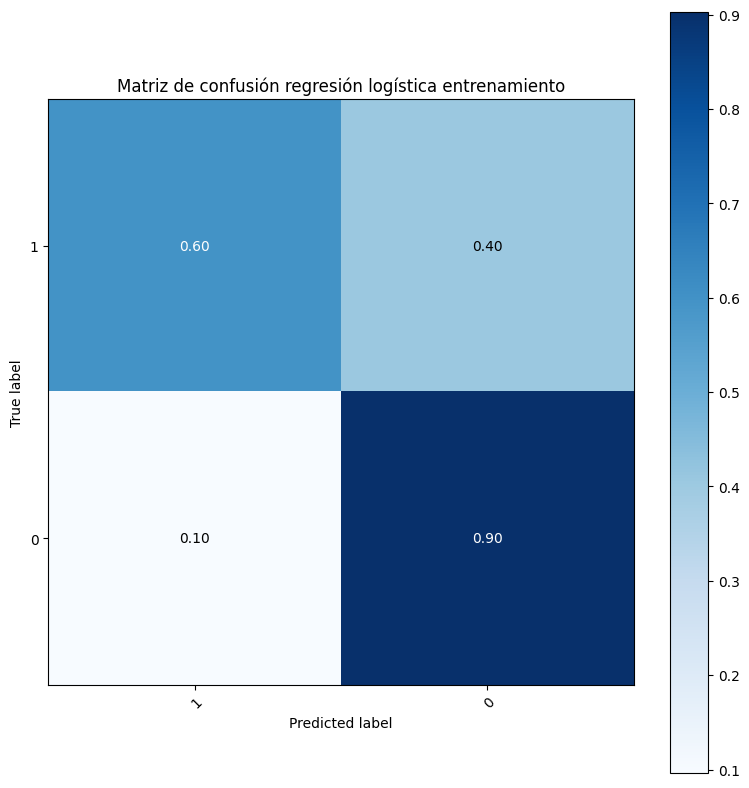

In [105]:
plot_confusion_matrix(y_train, y_pred_train_logistic, [1,0],normalize=True,title="Matriz de confusión regresión logística entrenamiento")



### Máquina de Soporte de Vectoress (SVC)

Normalized confusion matrix


<Axes: title={'center': 'Matriz de confusión SVC entrenamiento'}, xlabel='Predicted label', ylabel='True label'>

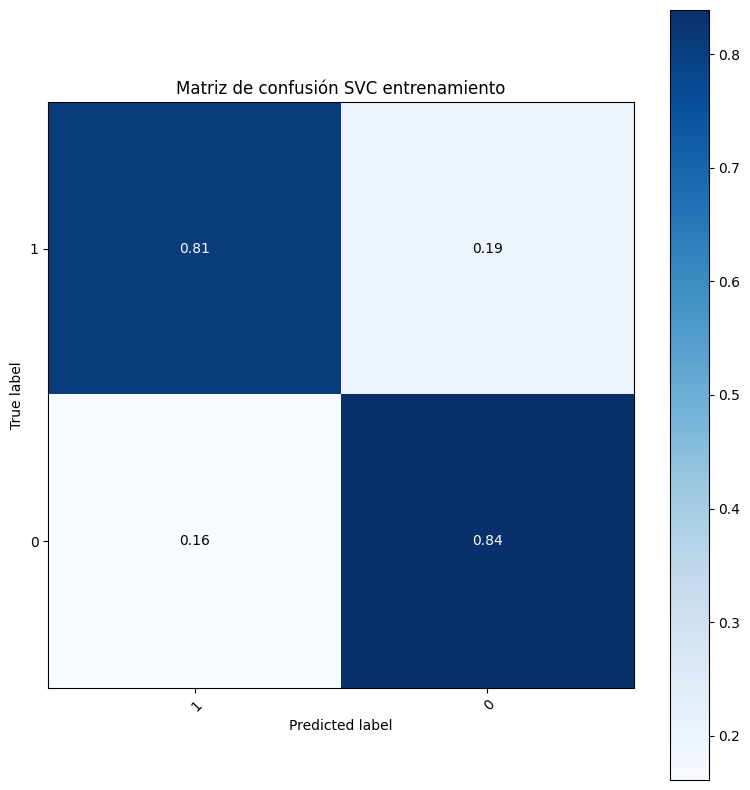

In [106]:
plot_confusion_matrix(y_train, y_pred_train_svc, [1,0],normalize=True,title="Matriz de confusión SVC entrenamiento")


###Random Forest

Normalized confusion matrix


<Axes: title={'center': 'Matriz de confusión Random Forest entrenamiento'}, xlabel='Predicted label', ylabel='True label'>

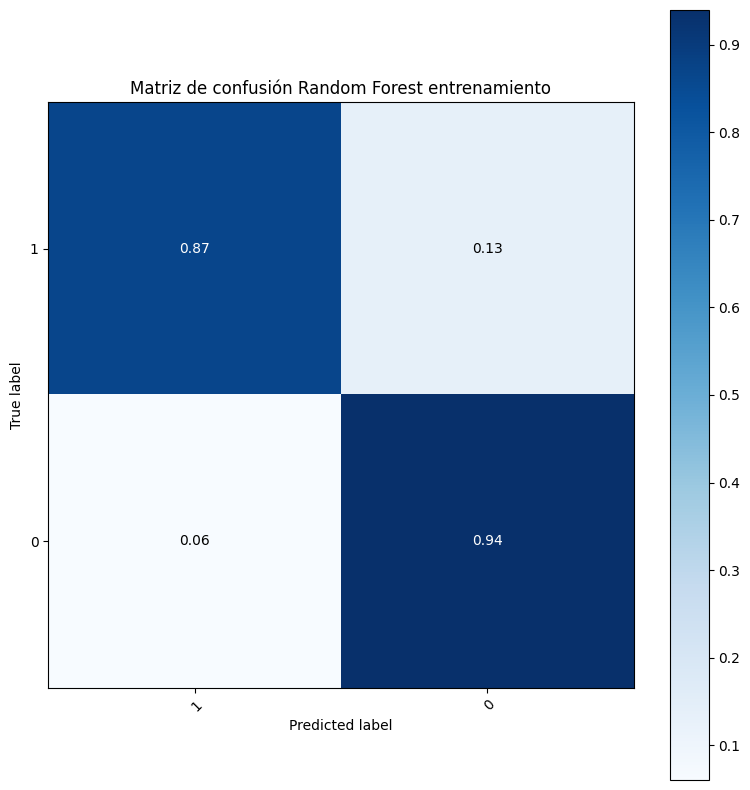

In [107]:
plot_confusion_matrix(y_train, y_pred_train_RandFor, [1,0],normalize=True,title="Matriz de confusión Random Forest entrenamiento")


###Adaboost

Normalized confusion matrix


<Axes: title={'center': 'Matriz de confusión Adaboost entrenamiento'}, xlabel='Predicted label', ylabel='True label'>

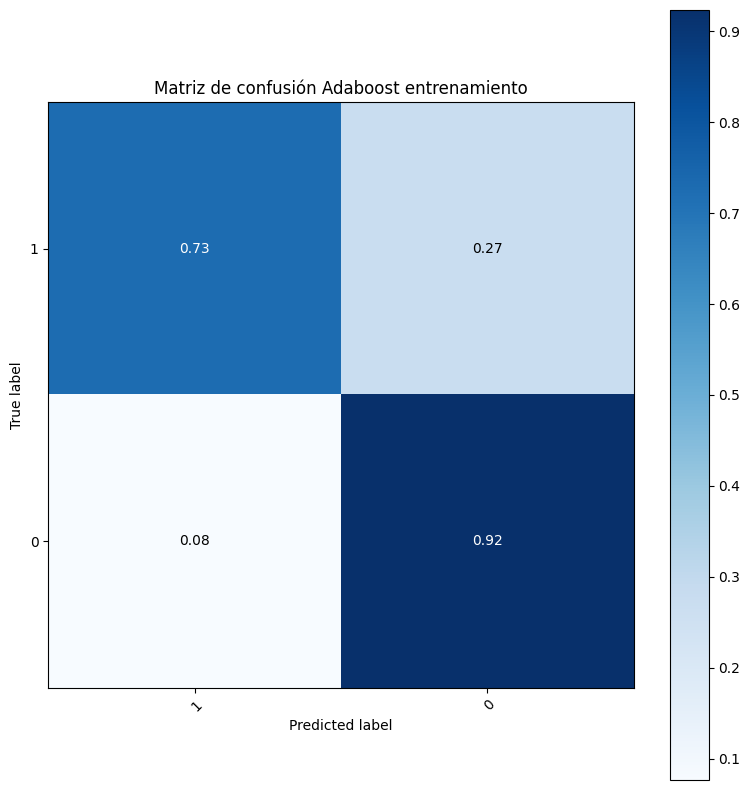

In [108]:
plot_confusion_matrix(y_train, y_pred_train_Adaboost, [1,0],normalize=True,title="Matriz de confusión Adaboost entrenamiento")


## Matrices de confusión en validación

###Regresión Logística

Normalized confusion matrix


<Axes: title={'center': 'Matriz de confusión regresión logística validación'}, xlabel='Predicted label', ylabel='True label'>

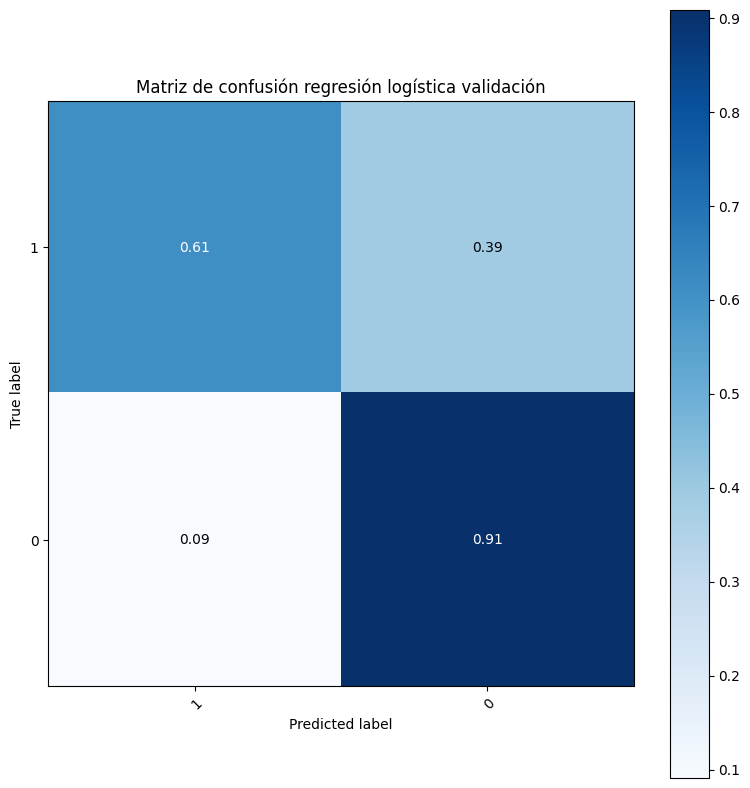

In [109]:
plot_confusion_matrix(y_val, y_pred_val_logistic, [1,0],normalize=True,title="Matriz de confusión regresión logística validación")


###Máquina de soporte de vectores(SVC)

Normalized confusion matrix


<Axes: title={'center': 'Matriz de confusión SVC validación'}, xlabel='Predicted label', ylabel='True label'>

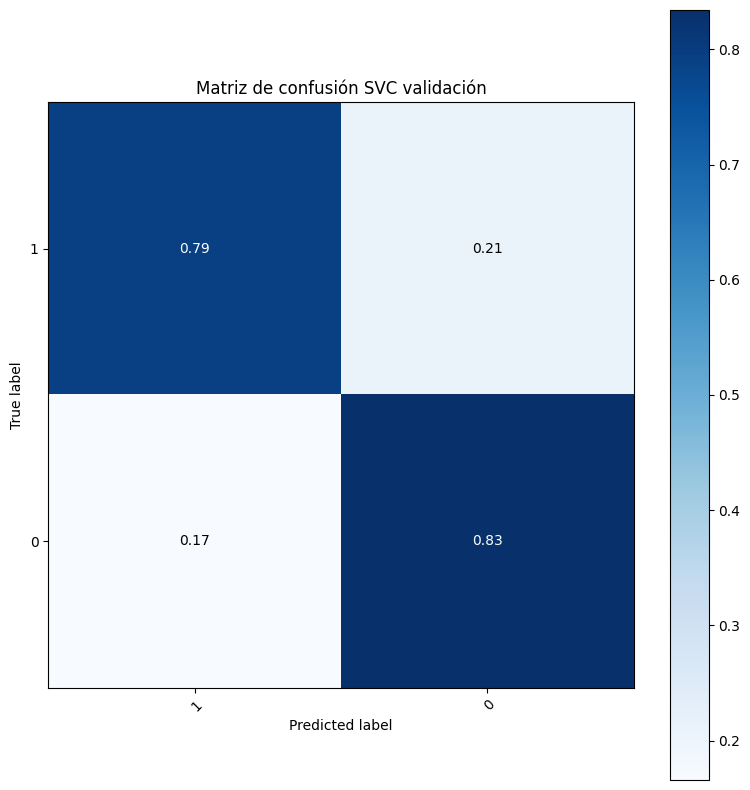

In [110]:
plot_confusion_matrix(y_val, y_pred_val_svc, [1,0],normalize=True,title="Matriz de confusión SVC validación")


###Random Forest

Normalized confusion matrix


<Axes: title={'center': 'Matriz de confusión Random Forest validación'}, xlabel='Predicted label', ylabel='True label'>

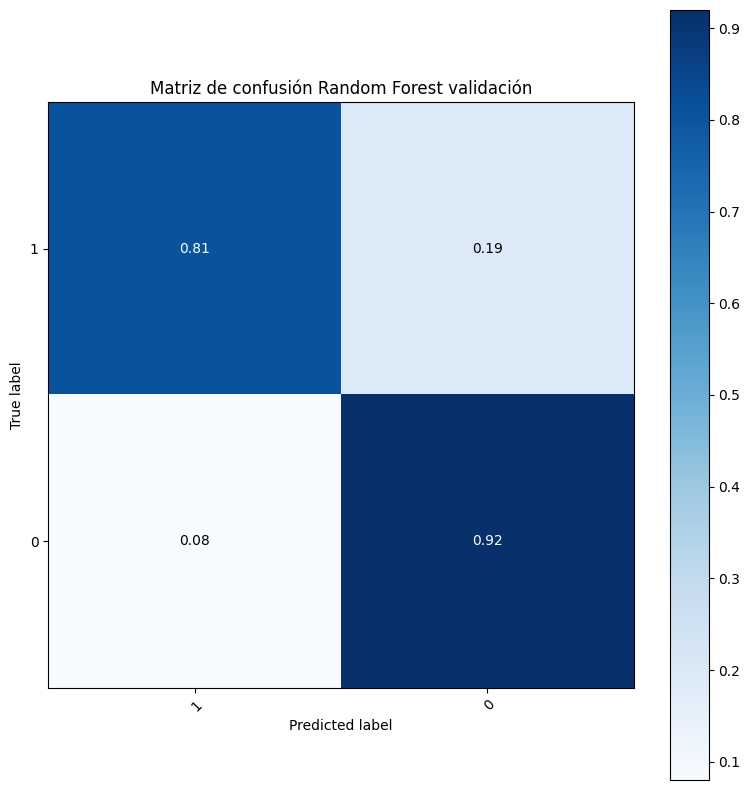

In [111]:
plot_confusion_matrix(y_val, y_pred_val_RandFor, [1,0],normalize=True,title="Matriz de confusión Random Forest validación")


###Adaboost

Normalized confusion matrix


<Axes: title={'center': 'Matriz de confusión Adaboost validación'}, xlabel='Predicted label', ylabel='True label'>

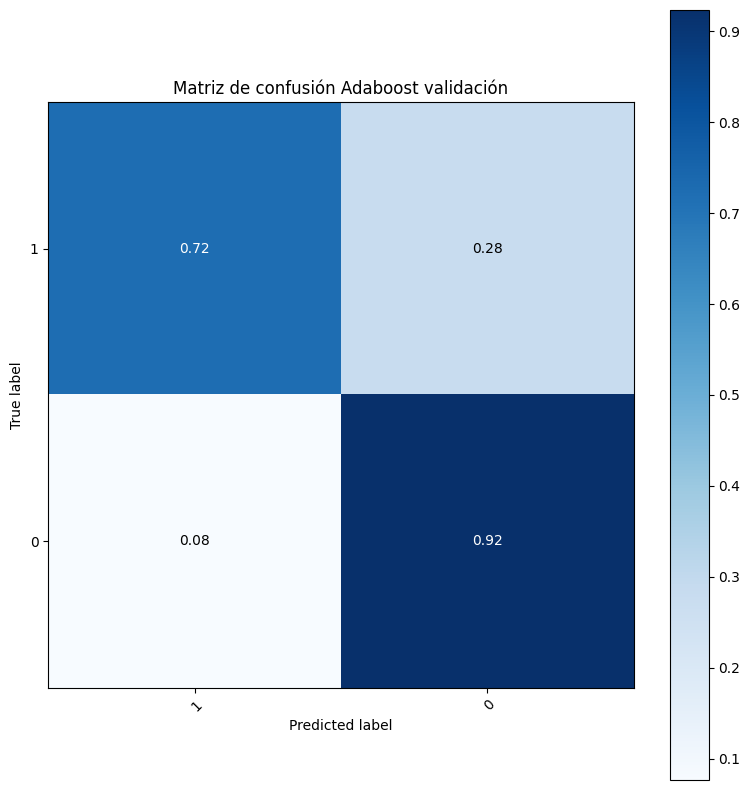

In [112]:
plot_confusion_matrix(y_val, y_pred_val_Adaboost, [1,0],normalize=True,title="Matriz de confusión Adaboost validación")


##Matrices de confusión en test

###Regresión Logística

Normalized confusion matrix


<Axes: title={'center': 'Matriz de confusión regresión logística test'}, xlabel='Predicted label', ylabel='True label'>

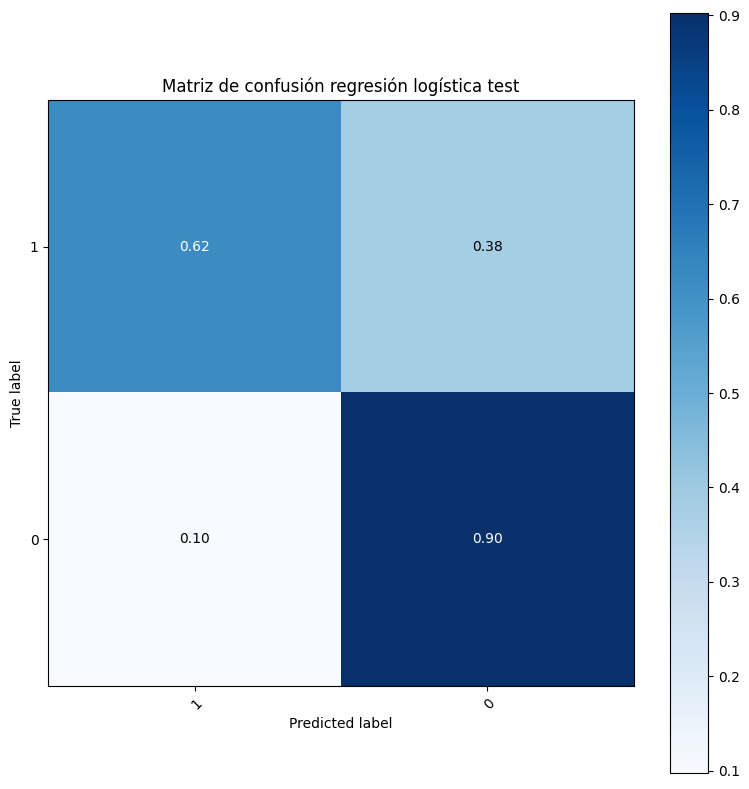

In [113]:
plot_confusion_matrix(y_test, y_pred_test_logistic, [1,0],normalize=True,title="Matriz de confusión regresión logística test")


###Máquina de Soporte de Vectores

Normalized confusion matrix


<Axes: title={'center': 'Matriz de confusión SVC test'}, xlabel='Predicted label', ylabel='True label'>

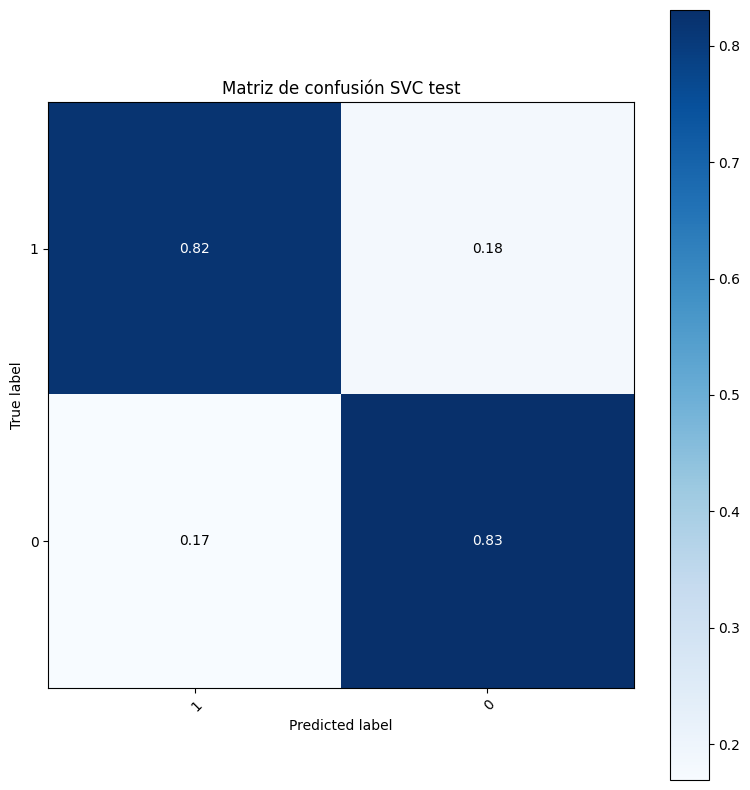

In [114]:
plot_confusion_matrix(y_test, y_pred_test_svc, [1,0],normalize=True,title="Matriz de confusión SVC test")


###Random Forest

Normalized confusion matrix


<Axes: title={'center': 'Matriz de confusión Random Forest test'}, xlabel='Predicted label', ylabel='True label'>

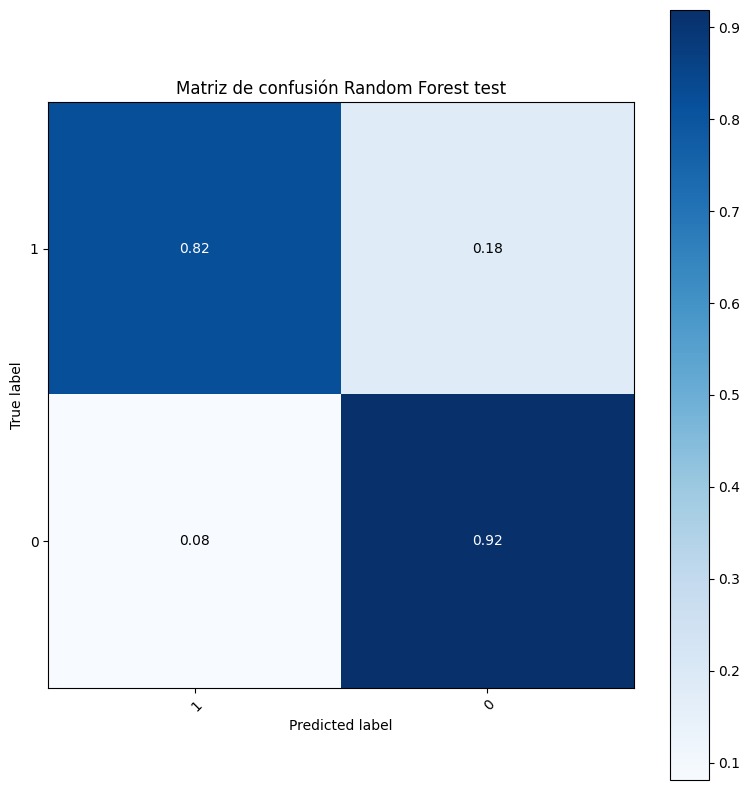

In [115]:
plot_confusion_matrix(y_test, y_pred_test_RandFor, [1,0],normalize=True,title="Matriz de confusión Random Forest test")


###Adaboost

Normalized confusion matrix


<Axes: title={'center': 'Matriz de confusión Adaboot test'}, xlabel='Predicted label', ylabel='True label'>

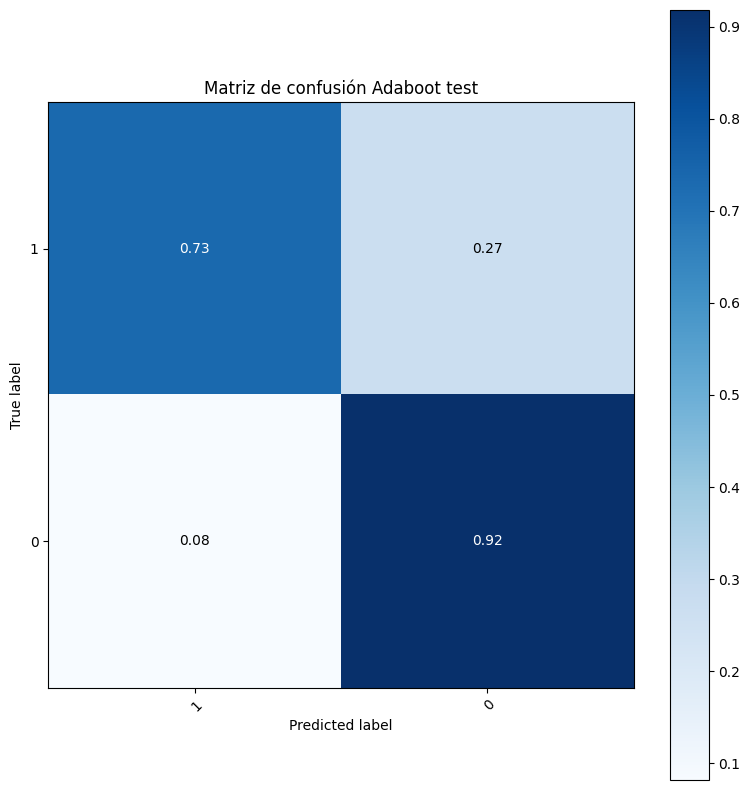

In [116]:
plot_confusion_matrix(y_test, y_pred_test_Adaboost, [1,0],normalize=True,title="Matriz de confusión Adaboot test")


#Métricas de desempeño

##Cración de tablas de resultados

In [117]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

#Metricas regresión logística
accuracy_logistica_train = accuracy_score(y_train, y_pred_train_logistic)
precision_loigsitca_train = precision_score(y_train, y_pred_train_logistic)
recall_logistica_train = recall_score(y_train, y_pred_train_logistic)
f1_logistica_train = f1_score(y_train, y_pred_train_logistic)

#Metricas SVC
accuracy_SVC_train = accuracy_score(y_train, y_pred_train_svc)
precision_SVC_train = precision_score(y_train, y_pred_train_svc)
recall_SVC_train = recall_score(y_train, y_pred_train_svc)
f1_SVC_train = f1_score(y_train, y_pred_train_svc)

#Metricas Random Forest
accuracy_RandFor_train = accuracy_score(y_train, y_pred_train_RandFor)
precision_RandFor_train = precision_score(y_train, y_pred_train_RandFor)
recall_RandFor_train = recall_score(y_train, y_pred_train_RandFor)
f1_RandFor_train = f1_score(y_train, y_pred_train_RandFor)

#Metricas Adaboost
accuracy_Adaboost_train = accuracy_score(y_train, y_pred_train_Adaboost)
precision_Adaboost_train = precision_score(y_train, y_pred_train_Adaboost)
recall_Adaboost_train = recall_score(y_train, y_pred_train_Adaboost)
f1_Adaboost_train = f1_score(y_train, y_pred_train_Adaboost)

data_train={
    'Modelo':['Regresión Logísitca','SVC','Random Forest','Adaboost'],
    'Accuracy':[accuracy_logistica_train,accuracy_SVC_train,accuracy_RandFor_train,accuracy_Adaboost_train],
    'Precision':[precision_loigsitca_train,precision_SVC_train,precision_RandFor_train,precision_Adaboost_train],
    'Recall':[recall_logistica_train,recall_SVC_train,recall_RandFor_train,recall_Adaboost_train],
    'F1 Score':[f1_logistica_train,f1_SVC_train,f1_RandFor_train,f1_Adaboost_train]
}

df_train=pd.DataFrame(data_train)

In [121]:
# Metricas regresión logística
accuracy_logistica_val = accuracy_score(y_val, y_pred_val_logistic)
precision_logistica_val = precision_score(y_val, y_pred_val_logistic)
recall_logistica_val = recall_score(y_val, y_pred_val_logistic)
f1_logistica_val = f1_score(y_val, y_pred_val_logistic)

# Metricas SVC
accuracy_SVC_val = accuracy_score(y_val, y_pred_val_svc)
precision_SVC_val = precision_score(y_val, y_pred_val_svc)
recall_SVC_val = recall_score(y_val, y_pred_val_svc)
f1_SVC_val = f1_score(y_val, y_pred_val_svc)

# Metricas Random Forest
accuracy_RandFor_val = accuracy_score(y_val, y_pred_val_RandFor)
precision_RandFor_val = precision_score(y_val, y_pred_val_RandFor)
recall_RandFor_val = recall_score(y_val, y_pred_val_RandFor)
f1_RandFor_val = f1_score(y_val, y_pred_val_RandFor)

# Metricas Adaboost
accuracy_Adaboost_val = accuracy_score(y_val, y_pred_val_Adaboost)
precision_Adaboost_val = precision_score(y_val, y_pred_val_Adaboost)
recall_Adaboost_val = recall_score(y_val, y_pred_val_Adaboost)
f1_Adaboost_val = f1_score(y_val, y_pred_val_Adaboost)

data_val = {
    'Modelo': ['Regresión Logística', 'SVC', 'Random Forest', 'Adaboost'],
    'Accuracy': [accuracy_logistica_val, accuracy_SVC_val, accuracy_RandFor_val, accuracy_Adaboost_val],
    'Precision': [precision_logistica_val, precision_SVC_val, precision_RandFor_val, precision_Adaboost_val],
    'Recall': [recall_logistica_val, recall_SVC_val, recall_RandFor_val, recall_Adaboost_val],
    'F1 Score': [f1_logistica_val, f1_SVC_val, f1_RandFor_val, f1_Adaboost_val]
}

df_val = pd.DataFrame(data_val)


In [119]:
# Metricas regresión logística
accuracy_logistica_test = accuracy_score(y_test, y_pred_test_logistic)
precision_logistica_test = precision_score(y_test, y_pred_test_logistic)
recall_logistica_test = recall_score(y_test, y_pred_test_logistic)
f1_logistica_test = f1_score(y_test, y_pred_test_logistic)

# Metricas SVC
accuracy_SVC_test = accuracy_score(y_test, y_pred_test_svc)
precision_SVC_test = precision_score(y_test, y_pred_test_svc)
recall_SVC_test = recall_score(y_test, y_pred_test_svc)
f1_SVC_test = f1_score(y_test, y_pred_test_svc)

# Metricas Random Forest
accuracy_RandFor_test = accuracy_score(y_test, y_pred_test_RandFor)
precision_RandFor_test = precision_score(y_test, y_pred_test_RandFor)
recall_RandFor_test = recall_score(y_test, y_pred_test_RandFor)
f1_RandFor_test = f1_score(y_test, y_pred_test_RandFor)

# Metricas Adaboost
accuracy_Adaboost_test = accuracy_score(y_test, y_pred_test_Adaboost)
precision_Adaboost_test = precision_score(y_test, y_pred_test_Adaboost)
recall_Adaboost_test = recall_score(y_test, y_pred_test_Adaboost)
f1_Adaboost_test = f1_score(y_test, y_pred_test_Adaboost)

data_test = {
    'Modelo': ['Regresión Logística', 'SVC', 'Random Forest', 'Adaboost'],
    'Accuracy': [accuracy_logistica_test, accuracy_SVC_test, accuracy_RandFor_test, accuracy_Adaboost_test],
    'Precision': [precision_logistica_test, precision_SVC_test, precision_RandFor_test, precision_Adaboost_test],
    'Recall': [recall_logistica_test, recall_SVC_test, recall_RandFor_test, recall_Adaboost_test],
    'F1 Score': [f1_logistica_test, f1_SVC_test, f1_RandFor_test, f1_Adaboost_test]
}

df_test = pd.DataFrame(data_test)


##Tabla de resulatdos

###Entrenamiento

In [122]:
df_train

,Modelo,Accuracy,Precision,Recall,F1 Score
0,Regresión Logísitca,0.803462,0.823160,0.903205,0.861327
1,SVC,0.828180,0.900157,0.838782,0.868386
2,Random Forest,0.916415,0.936682,0.939846,0.938261
3,Adaboost,0.859401,0.875287,0.923533,0.898763


###Validación

In [123]:
df_val

,Modelo,Accuracy,Precision,Recall,F1 Score
0,Regresión Logística,0.807613,0.820507,0.908548,0.862286
1,SVC,0.819497,0.886772,0.834243,0.859705
2,Random Forest,0.882191,0.904008,0.919979,0.911924
3,Adaboost,0.855494,0.867252,0.923357,0.894426


###Test

In [124]:
df_test

,Modelo,Accuracy,Precision,Recall,F1 Score
0,Regresión Logística,0.808185,0.826727,0.902349,0.862884
1,SVC,0.826650,0.902417,0.830655,0.865050
2,Random Forest,0.886041,0.911338,0.919036,0.915171
3,Adaboost,0.856552,0.873750,0.918212,0.895429


#Conclusiones

Al finalizar nuestro proyecto podemos obtener varias conclusiones al respecto. La primera es que en general los cuatro modelos tuvieron un buen desempeño, si nos fijamos bien, todos los modelos lograron una precisión (Nuestra métrica objetivo) mayor a 0.8 en los tres escenarios tanto en entrenamiento, como en validación y test, lo cual es muy bueno. Adicionalmente, en ninguno de los cuatro se observa underfitting ni overfitting.

Esto se debe principalmente a la ingeniería de características aplicada, la estrategia aplicada consistió en pasar a categóricas la mayor cantidad de variables posibles, y así tener una mejor informacón sobre la reserva y al mismo tiempo poder manejar el desbalanceo de clases. En general se puede decir que la estrategia de preprocesamiento aplicada fue todo un éxito ya que permitió a los 4 modelos desempeñarse de manera acertada.

Ahora, otro factor clave es la validación cruzada y la búsqueda de hiperparámetros. De esta manera se logra obtener la mejor combinación posible de hiperparámetros y validarlos, permitiendo entrenar modelos robustos.


**¿Cuál es el mejor modelo segun el objetivo del negocio y por qué?**

Para responder la pregunta final, hay que hacer énfasis en que el objetivo inicialmente fue una alta precisión en la predicción de la variable positiva, la cual asociamos a "Not_canceled". Por esta razón, todos nuestros modelos se entrenaron teniendo como referencia la métrica 'precision'. Si miramos en los resultados, Random Forest logró un desempeño magnífico en precisión. Practicamente obtuvo más de 0.9 en los tres escenarios (Entrenamiuento, validación y test) razón por la cual este es el modelo que se escogería.

No obstante, si hablamos de beneficio/costo la SVC también obtuvo muy buenos resultados (El segundo mejor modelo) y al haber utilizado RandomizedSearchCV, su tiempo de entrenamiento fue sorprendentemente bajo (Casi 30 minutos), si lo comparamos con el tiempo que tomó el RandomForest usando GridSearchCV (Más de 3 horas). Por lo que se podría decir que también fue un muy buen modelo.

**Cosas por mejorar:**

Sería interesante en el caso de la SVC poder utilizar GridSearchCV en vez de RandomizedSearchCV y mirar qué tanto cambian las métricas. Sin embargo, esto requiere una capacidad de procesamiento mucho más robusta.



